# Julia言語

## グラフのプロット

前回の講義でJuliaの基本的な構文を学びましたので、  
次はどんどん実戦を重ねて、その中で学んでいきましょう   



## グラフのプロット準備
まずはREPLからPkgモードを開いて、Plotsをインストールします。  
PkgモードからPlotsをインストールする方法はjulialecture1を参照してください。  
  
インストールしたパッケージは以下の要領でソース内で使うことができます。  

In [3]:
using Plots
gr()

Plots.GRBackend()

usingは宣言したモジュールを参照するというものです。  
JuliaのPlotsは  
grやPlotly, pyplotといった  
実際のプロット支援ツール(**バックエンド**と呼びます。)をPlots内の関数で橋渡しする仕様です。  
Plotsの関数を覚えれば、ほしいプロット支援ツールを使えます。  
http://docs.juliaplots.org/latest/backends/  
pyplotとgrが一般的ですが、  
pyplotはpython連携が必要なため、  
ここではgr()にしておきましょう。  

## 1-dプロット
Julia には一通りの三角関数が用意されており、引数にはスカラだけでなく行列を取ることもできます。  
ここでは、-2π から4πまでの三角関数を表示させて、  
プロットの基本的な使い方を学んでみよう。  

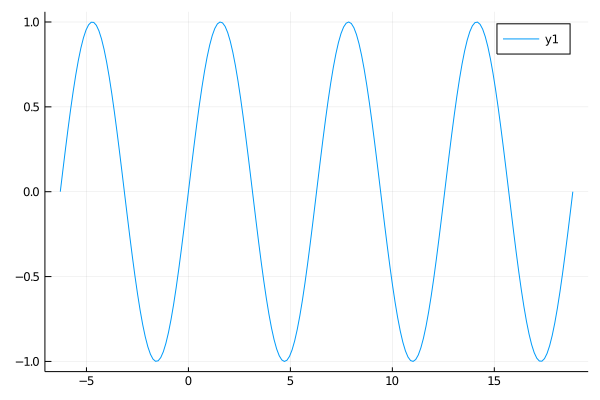

In [1]:
using Plots
gr()
# 以降明記しなければ
# using Plots
# gr()
#を付随するものとします。 
  
x = range(-2π,stop = 6π, length = 200)
plot(x,sin.(x))

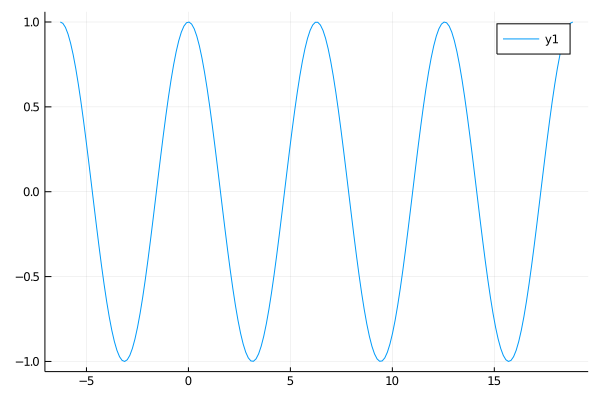

In [2]:
x = range(-2π,stop = 6π, length = 200)
plot(x,cos.(x))

Plot(x,y)が基本構文です。  
xとyは必ずしも対応している必要はありません。  
例えば横軸をπの係数にしたければ、πで割ればいいです。  
xはrangeなので、./とする必要があります。  


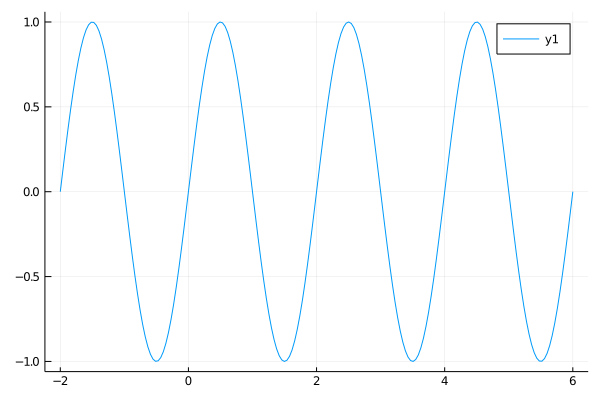

In [4]:
x = range(-2π,stop = 6π, length = 200)
plot(x ./ π, sin.(x))

二つのグラフを重ね合わせたい場合には、  
二つ目以降、重ね合わせるグラフのplot を plot!とします。  

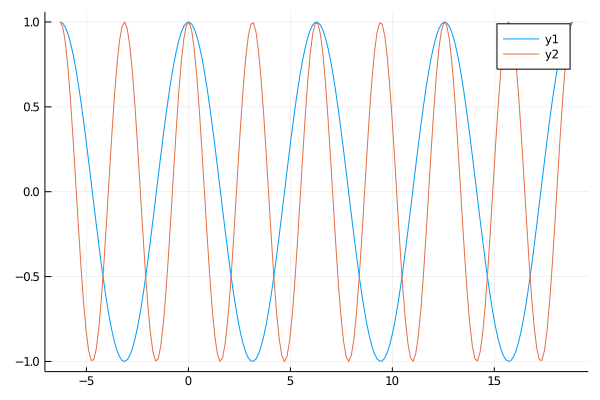

In [8]:
x = range(-2π,stop = 6π, length = 200)
plot(x,cos.(x))
plot!(x,cos.(2x))


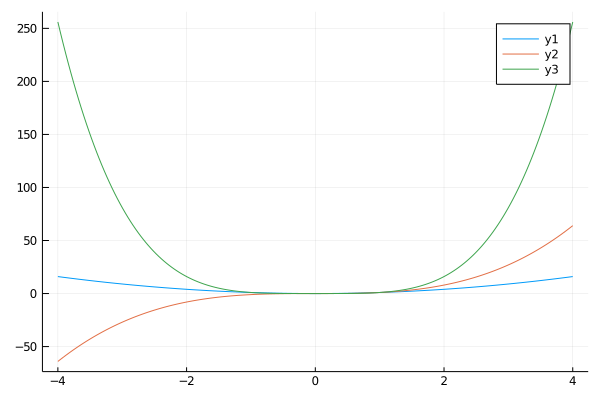

In [5]:
x = range(-4,stop = 4, length = 200)
plot(x, x.^2)
plot!(x, x.^3)
plot!(x, x.^4)


グラフのデザイン変更をしたい場合には、引数を追加します。  


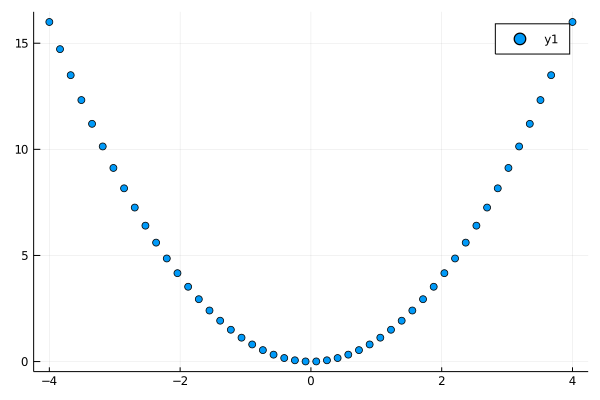

In [5]:
x = range(-4,stop = 4, length = 50)
plot(x, x.^2, st=:scatter) #stはseriestypeオプション

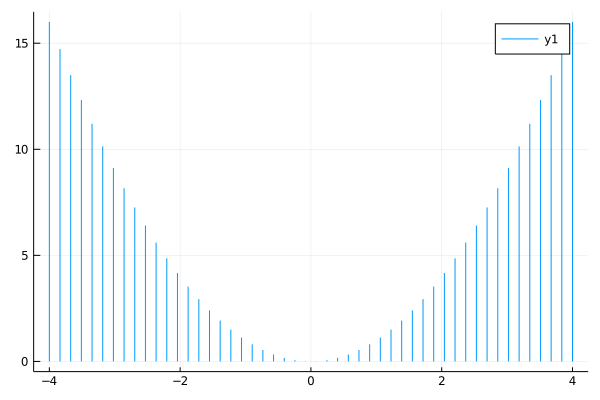

In [10]:
x = range(-4,stop = 4, length = 50)
plot(x, x.^2, st=:sticks)

色を変えたければ、linecolor  
label で凡例  
legend  で位置  
xlabel,ylabelでx軸、y軸座標ラベル
x幅、y幅はxlim, ylimをタプルで渡す。  
全体に作用する項目は最初に宣言しておけばよい。  

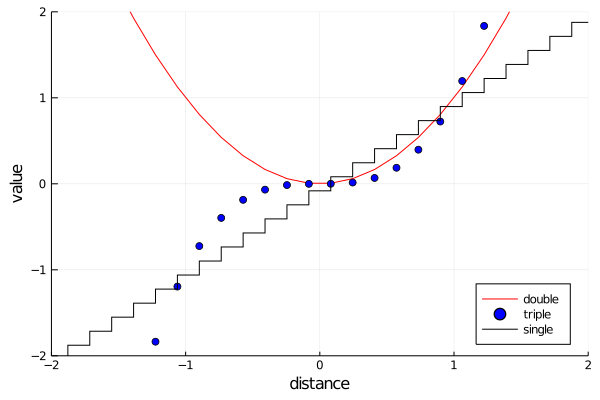

In [25]:
x = range(-4,stop = 4, length = 50)
plot(x, x.^2, linecolor = :red, 
    label = "double",
    legend = :bottomright,
    xlim = (-2,2),
    ylim = (-2,2),
    xlabel = "distance",
    ylabel = "value") 
plot!(x, x.^3, st = :scatter, markercolor = :blue, label = "triple")
plot!(x, x, st = :steppost, linecolor = :black, label = "single")

## 2-D プロット  


ブロードキャストを使うことで非常に簡単に２D プロットをすることができる。  
'アポストロフィは転置記号  
注意： 
pythonやmatlabユーザーはmeshgridしたくなると思うけど、  
転置とブロードキャストを組み合わせれば必要ないです。  
不要なメモリ確保も必要ないのでこっちの方が効率的です。  

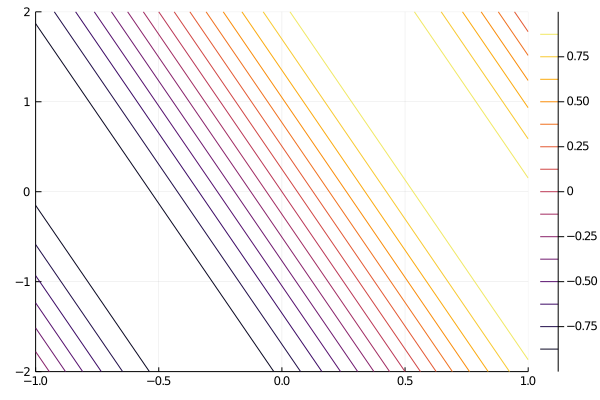

In [36]:
x = range(-1,stop = 1, length = 100)
y = range(-2,stop = 2, length = 100)

plot(x,y,sin.(x.+y'))# 2Dは等高線に自動的になります。  

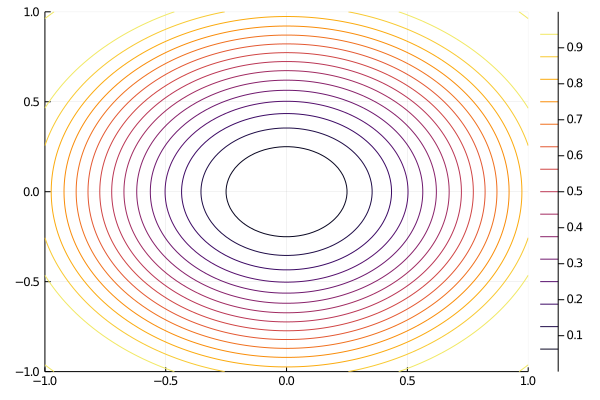

In [37]:
x = range(-1,stop = 1, length = 100)
y = range(-1,stop = 1, length = 100)
f(x,y) = sin(x^2 + y^2)
contour(x,y,f.(x,y'))  #等高線を明示したければcontour

In [48]:
x = range(-1,stop = 1, length = 100)
y = range(-1,stop = 1, length = 100)
f(x,y) = sin(x^2 + y^2)
contour(x,y,f.(x,y'), fill = true, line = false, levels = 200)  

In [49]:
x = range(-1,stop = 1, length = 100)
y = range(-1,stop = 1, length = 100)
f(x,y) = sin(x^2 + y^2)
contour(x,y,f.(x,y'), fill = true, line = false, levels = 200)  

In [51]:
x = range(-1,stop = 1, length = 100)
y = range(-1,stop = 1, length = 100)
f(x,y) = sin(x^2 + y^2)
wireframe(x,y,f.(x,y'))  